D:\Major Project\Notebooks\tf_env\Lib\site-packages\torch\nn\modules\module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)
D:\Major Project\Notebooks\tf_env\Lib\site-packages\torch\autograd\graph.py:823: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\cuda\CublasHandlePool.cpp:180.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_925.jpg


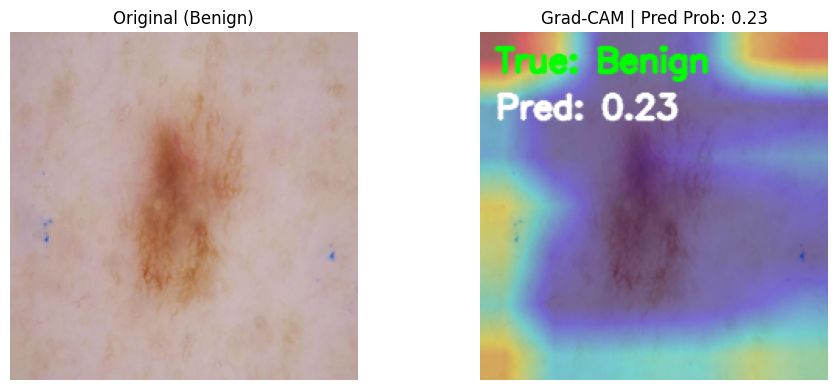

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_1336.jpg


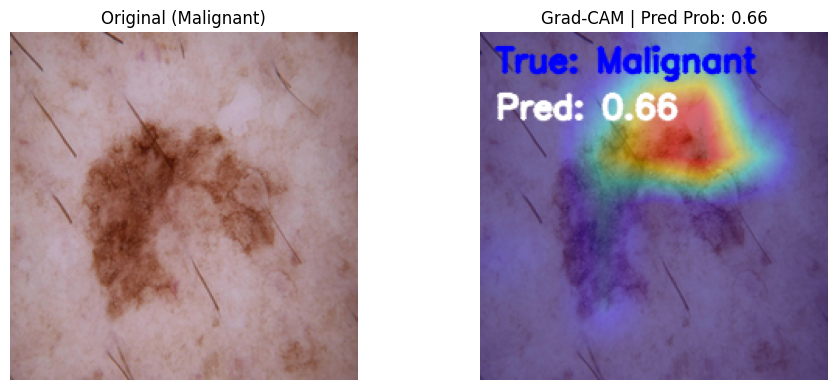

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_1170.jpg


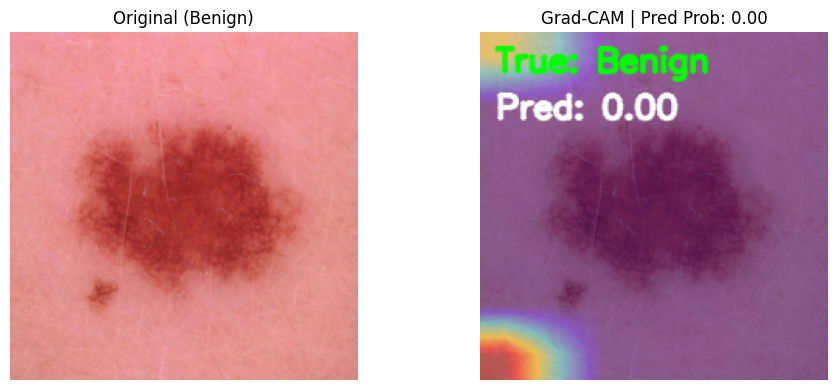

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_903.jpg


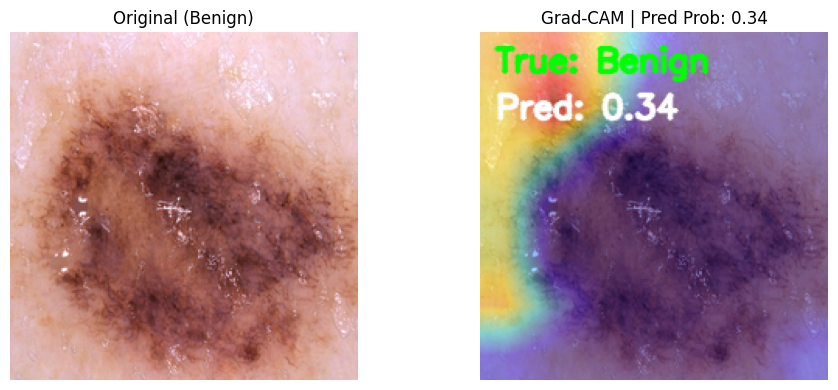

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_216.jpg


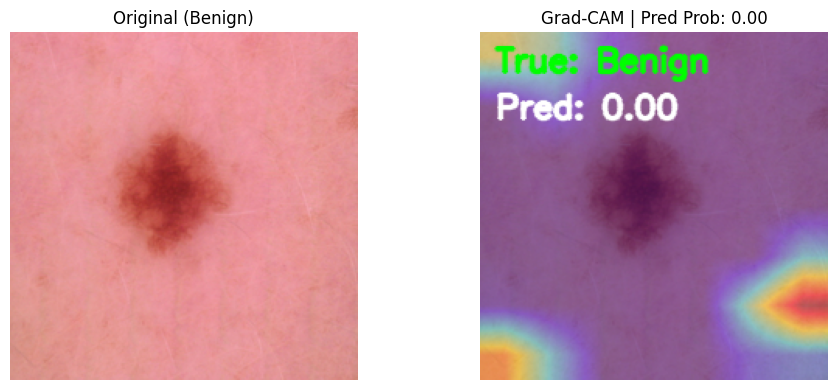

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_200.jpg


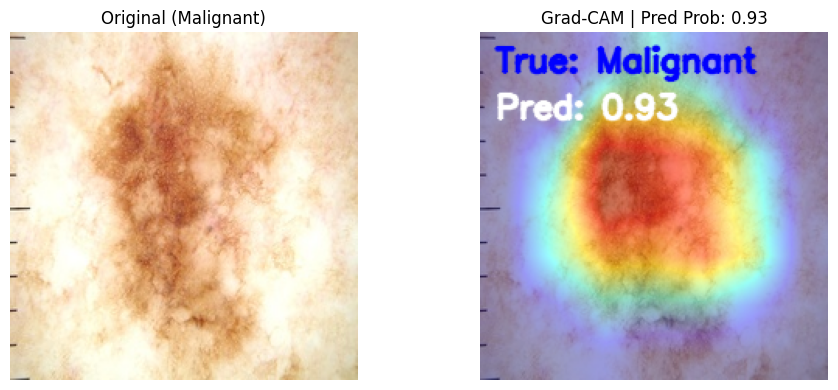

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_1579.jpg


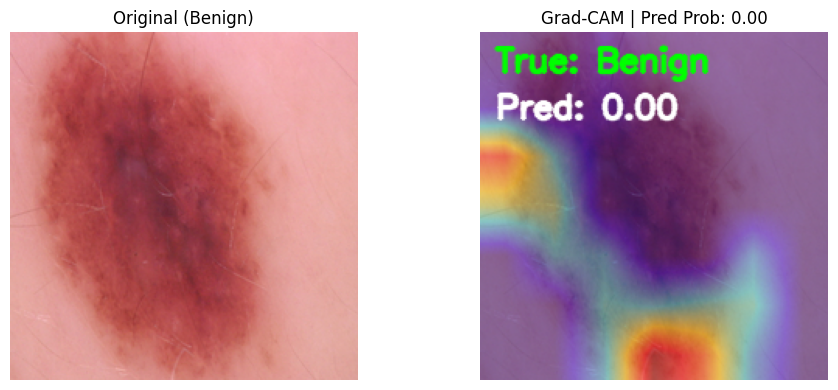

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_1362.jpg


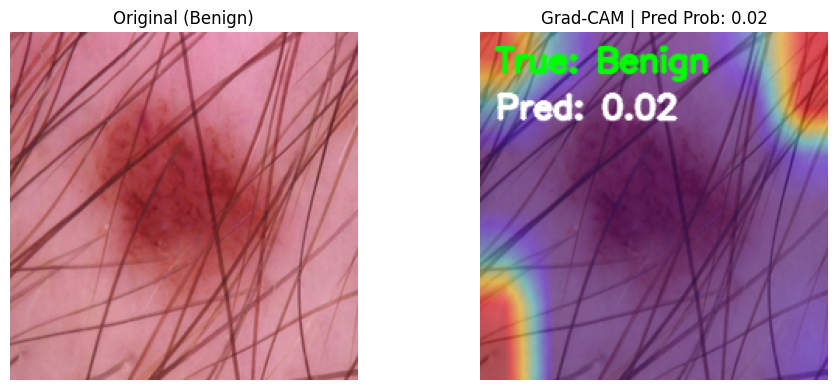

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_619.jpg


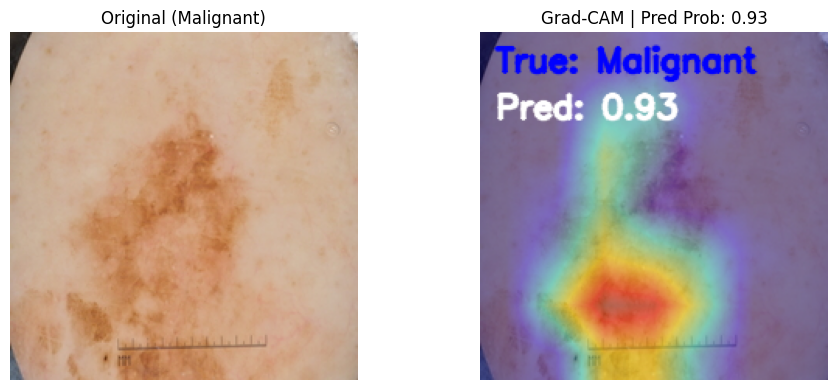

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_1592.jpg


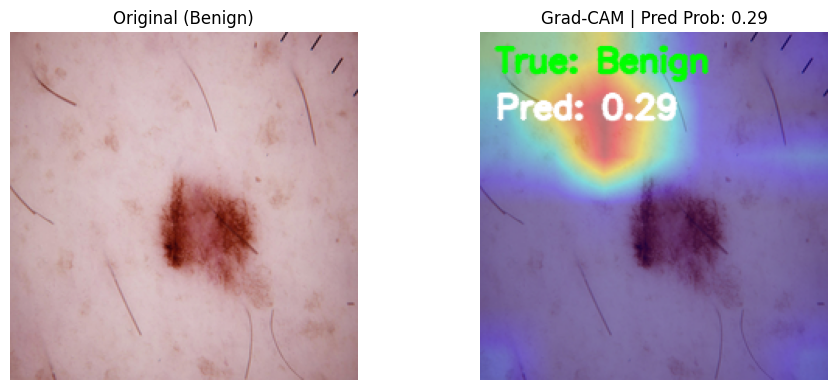

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_1198.jpg


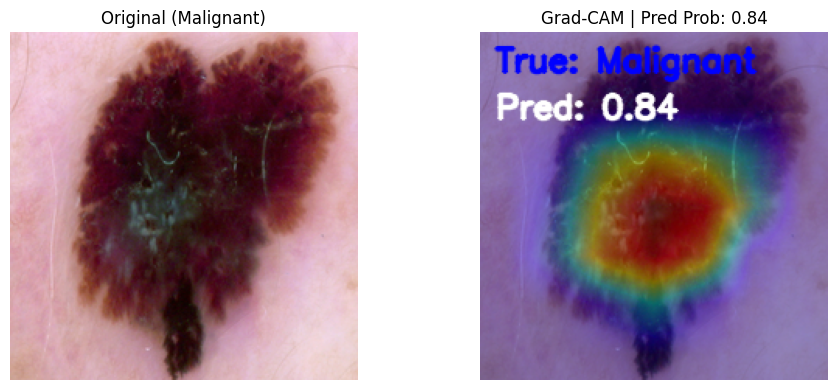

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_1110.jpg


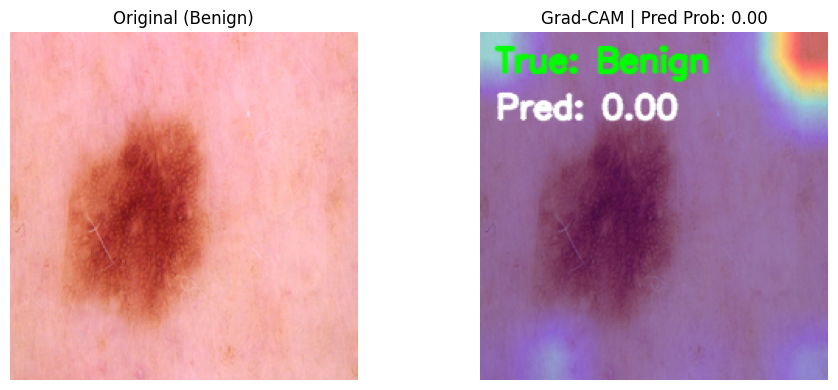

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_66.jpg


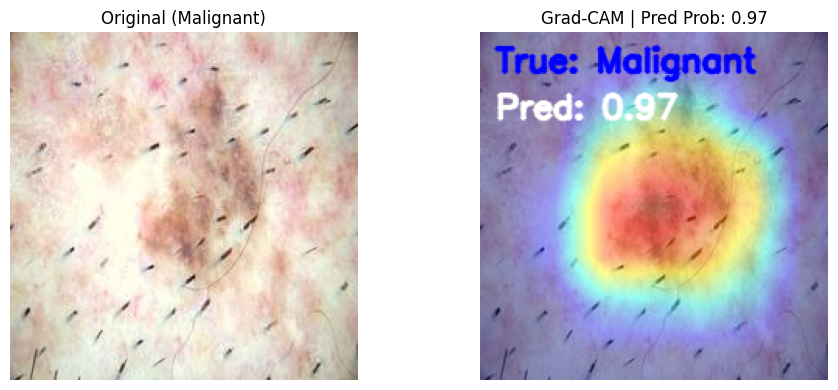

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_1756.jpg


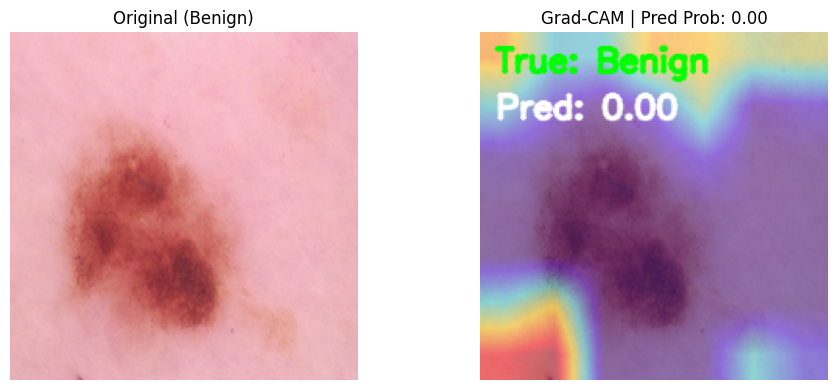

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_909.jpg


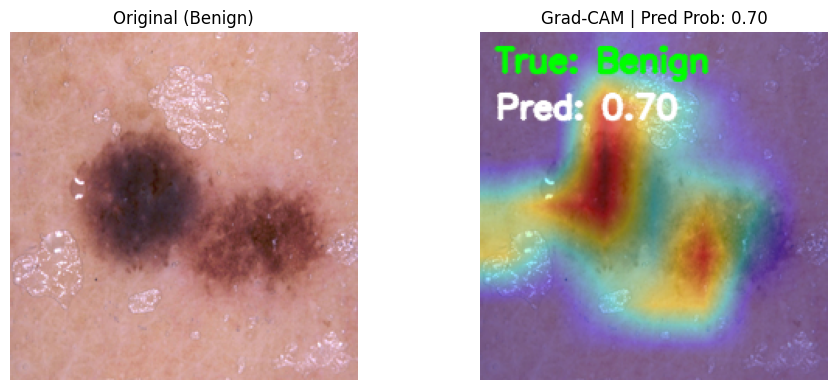

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_1611.jpg


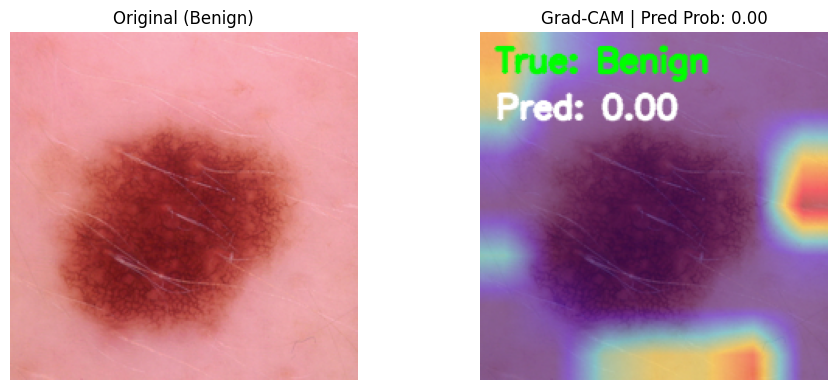

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_998.jpg


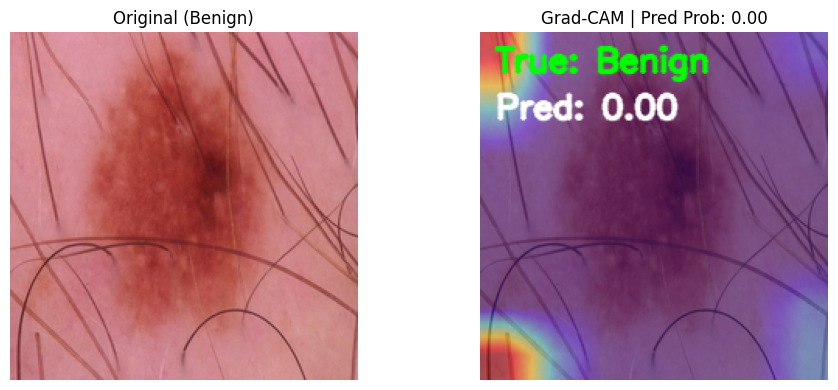

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_385.jpg


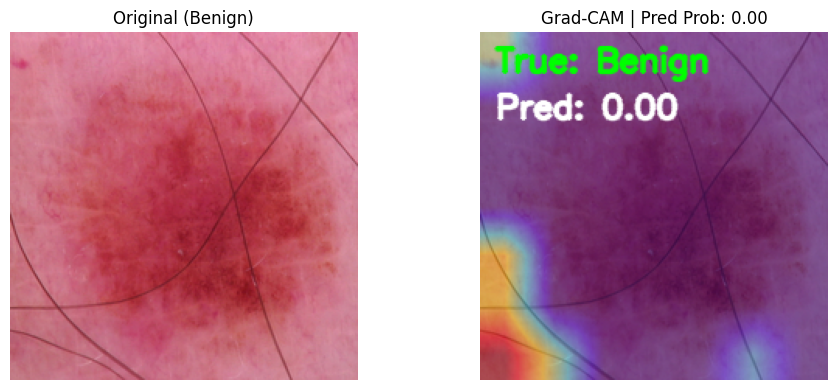

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_414.jpg


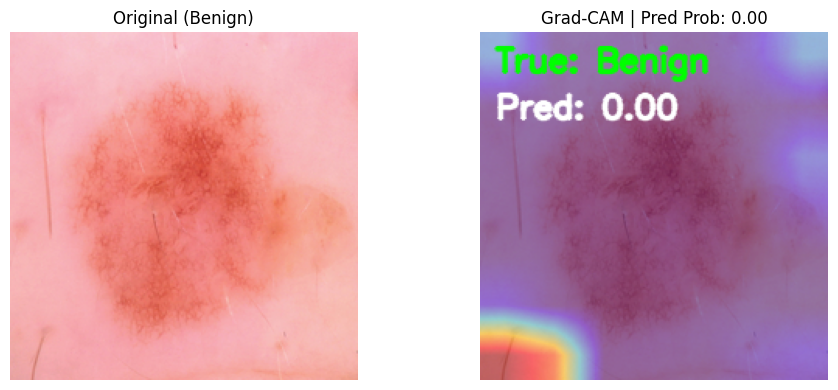

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_1347.jpg


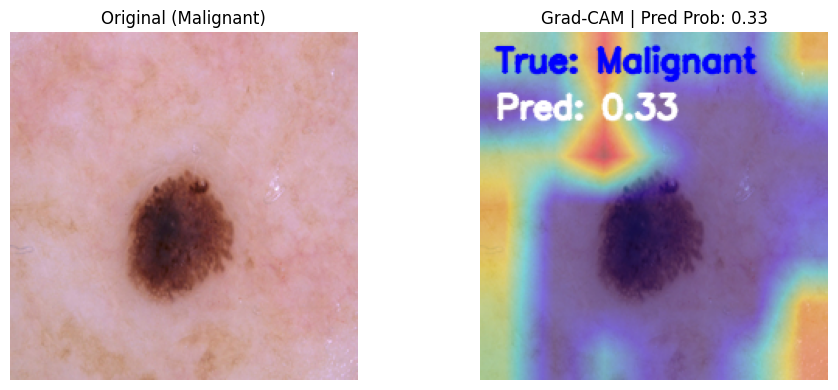

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_504.jpg


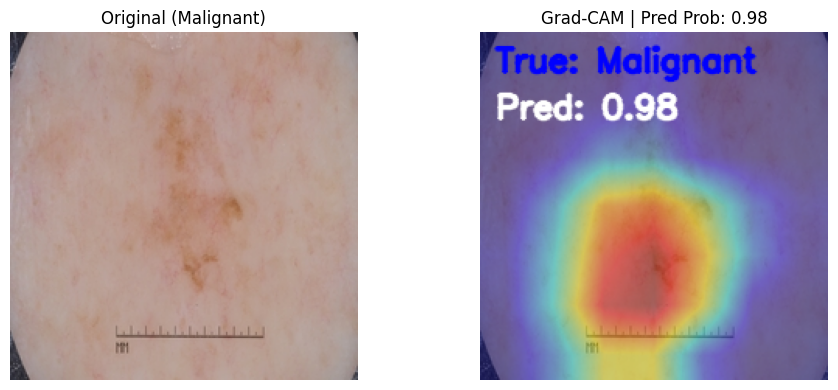

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_602.jpg


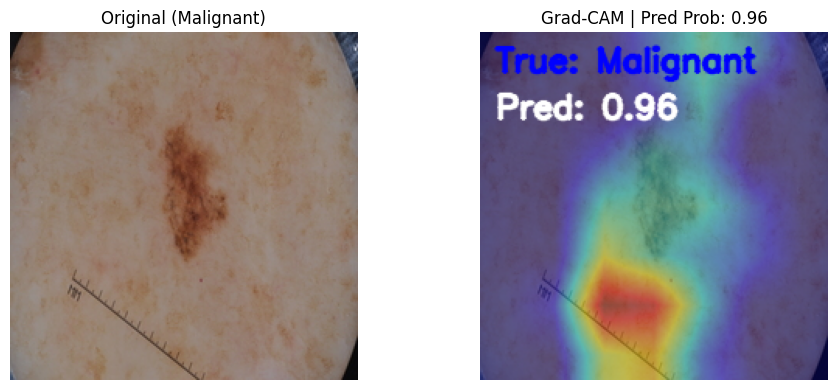

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_52.jpg


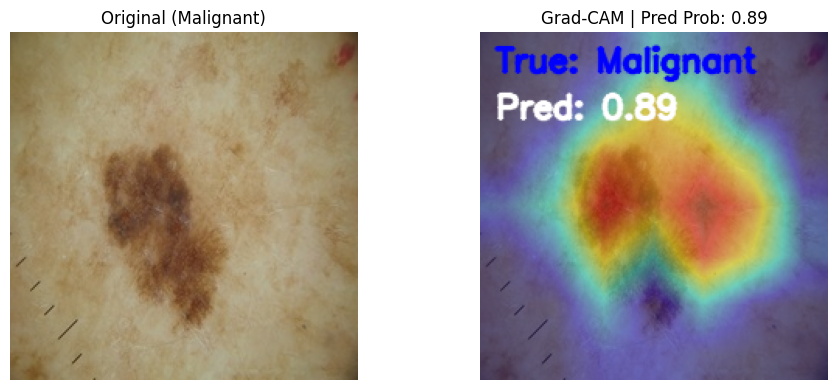

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_182.jpg


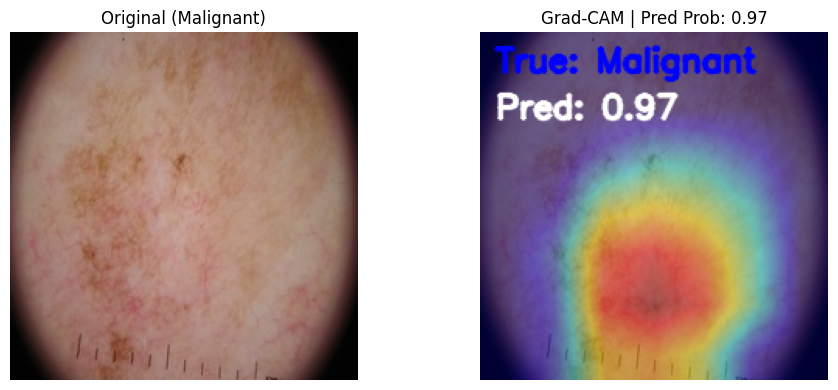

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_817.jpg


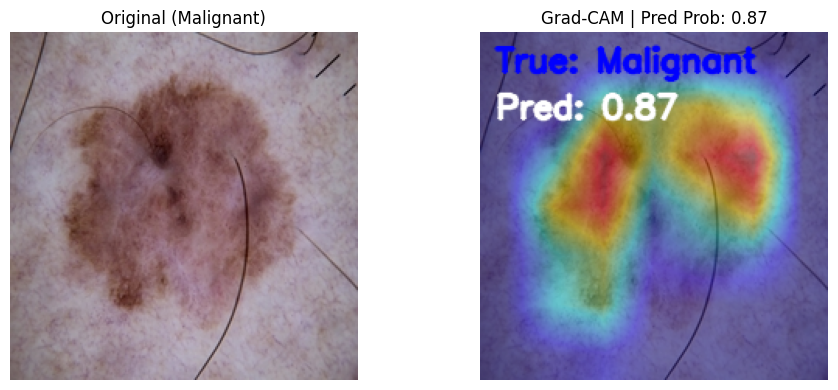

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_1521.jpg


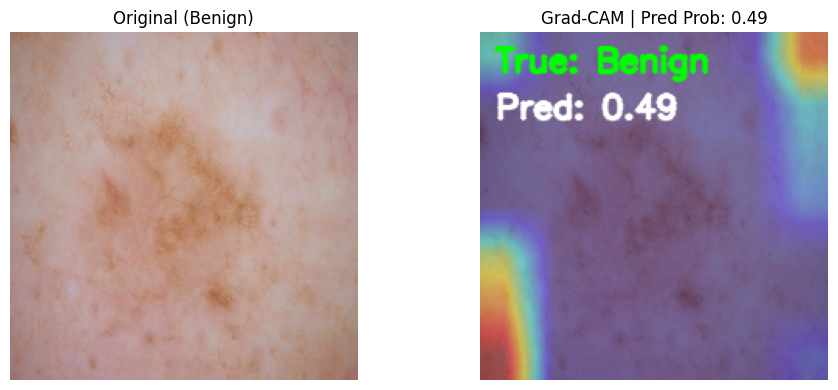

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_972.jpg


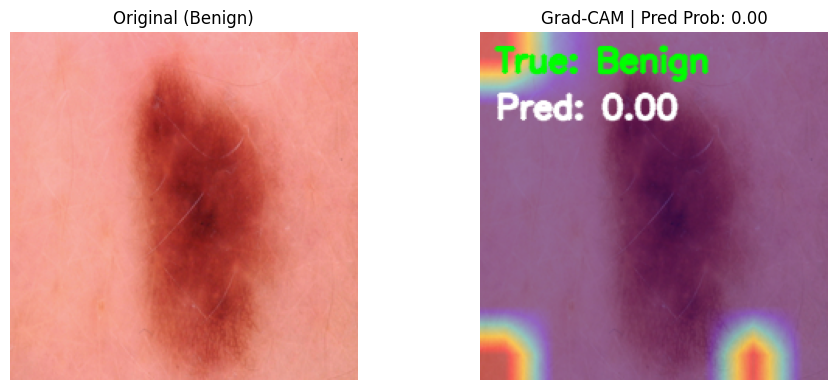

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_1130.jpg


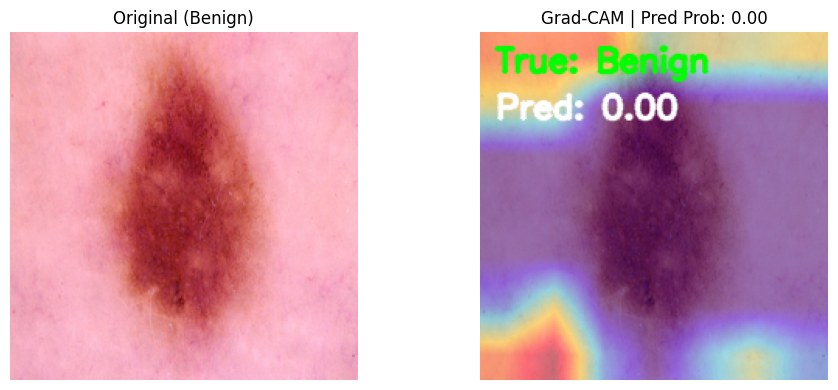

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_1125.jpg


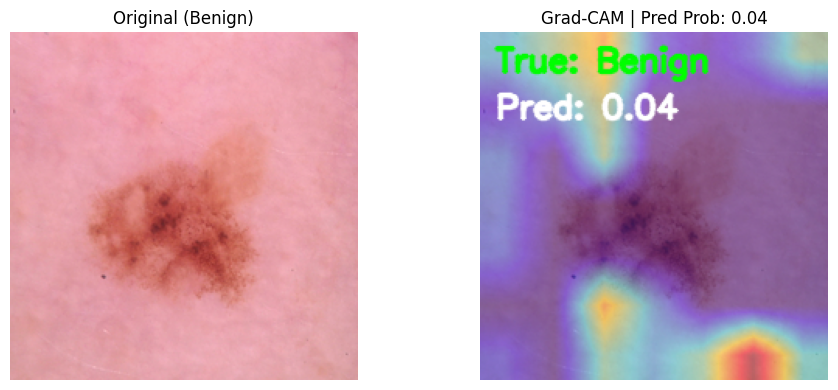

✅ Saved Grad-CAM: gradcam_results_pipeline1\gradcam_322.jpg


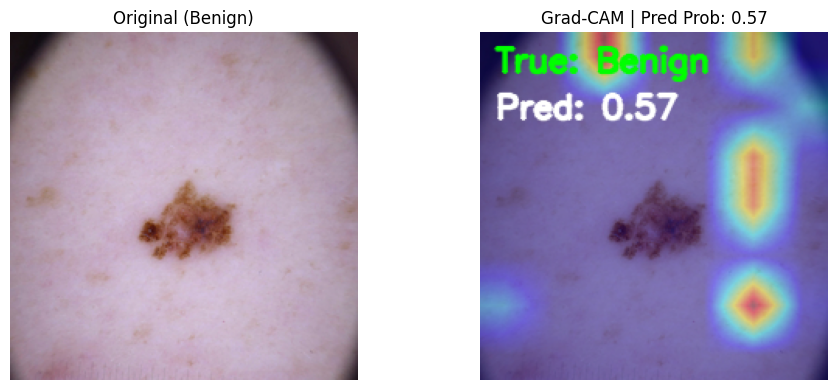

In [1]:
import os
import random
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
import timm
import cv2

# ----------------------------
# 1. CONFIG
# ----------------------------
MODEL_PATH = "best_model.pth"           # path to your saved .pth file
IMG_DIR    = r"D:\Major Project\archive\data\test"   # folder containing class folders
BACKBONE   = "resnet34"                 # must match the model you trained
IMG_SIZE   = 224
DEVICE     = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ----------------------------
# 2. MODEL DEFINITION (same as training)
# ----------------------------
class SEBlock(nn.Module):
    def __init__(self, channels, reduction=16):
        super().__init__()
        self.fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(channels, channels // reduction, 1),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels // reduction, channels, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        w = self.fc(x)
        return x * w

class AttentionBackbone(nn.Module):
    def __init__(self, backbone_name='resnet34', pretrained=False, embed_dim=512):
        super().__init__()
        self.backbone   = timm.create_model(backbone_name, pretrained=pretrained, features_only=True)
        feat_channels   = self.backbone.feature_info[-1]['num_chs']
        self.se         = SEBlock(feat_channels)
        self.pool       = nn.AdaptiveAvgPool2d(1)
        self.fc         = nn.Sequential(
            nn.Flatten(),
            nn.Linear(feat_channels, embed_dim),
            nn.ReLU(inplace=True)
        )
        self.classifier = nn.Linear(embed_dim, 1)

    def forward(self, x):
        feats  = self.backbone(x)[-1]
        feats  = self.se(feats)
        pooled = self.pool(feats)
        emb    = self.fc(pooled)
        logits = self.classifier(emb).squeeze(1)
        return logits, feats  # returning both logits and last feature map for GradCAM


# ----------------------------
# 3. LOAD MODEL
# ----------------------------
model = AttentionBackbone(backbone_name=BACKBONE, pretrained=False).to(DEVICE)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.eval()


# ----------------------------
# 4. IMAGE TRANSFORMS
# ----------------------------
transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


# ----------------------------
# 5. Grad-CAM IMPLEMENTATION
# ----------------------------
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook()

    def hook(self):
        def forward_hook(module, input, output):
            self.activations = output
        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0]
        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def generate(self, class_idx):
        grads = self.gradients
        acts  = self.activations
        weights = torch.mean(grads, dim=(2,3), keepdim=True)  # global avg pool over spatial
        cam = (weights * acts).sum(dim=1, keepdim=True)
        cam = torch.relu(cam)
        cam = torch.nn.functional.interpolate(cam, size=(IMG_SIZE, IMG_SIZE), mode='bilinear', align_corners=False)
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        return cam.squeeze().detach().cpu().numpy()

SAVE_DIR = "gradcam_results_pipeline1"
os.makedirs(SAVE_DIR, exist_ok=True)

# ----------------------------
# 6. VISUALIZATION FUNCTION
# ----------------------------
def show_and_save_gradcam(img_path, model, cam_generator, save_dir=SAVE_DIR):
    # ------------------------------
    # Get ground-truth label from folder name
    # ------------------------------
    true_label = os.path.basename(os.path.dirname(img_path)).lower()
    if "malignant" in true_label:
        true_label_text = "Malignant"
    elif "benign" in true_label:
        true_label_text = "Benign"
    else:
        true_label_text = "Unknown"

    # ------------------------------
    # Load image
    # ------------------------------
    img_pil = Image.open(img_path).convert("RGB")
    img_tensor = transform(img_pil).unsqueeze(0).to(DEVICE)

    # Forward + backward pass
    logits, _ = model(img_tensor)
    prob = torch.sigmoid(logits).item()
    model.zero_grad()
    logits.backward()

    # Generate Grad-CAM heatmap
    cam = cam_generator.generate(class_idx=0)
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    img_np = np.array(img_pil.resize((IMG_SIZE, IMG_SIZE)))
    overlay = 0.4 * heatmap[..., ::-1] + 0.6 * img_np
    overlay = np.uint8(np.clip(overlay, 0, 255))

    # ------------------------------
    # Add text (true label + prediction)
    # ------------------------------
    text_color = (0, 255, 0) if "benign" in true_label_text.lower() else (0, 0, 255)
    cv2.putText(
        overlay,
        f"True: {true_label_text}",
        (10, 25),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.7,
        text_color,
        2,
        cv2.LINE_AA,
    )
    cv2.putText(
        overlay,
        f"Pred: {prob:.2f}",
        (10, 55),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.7,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    # ------------------------------
    # Save visualization
    # ------------------------------
    base_name = os.path.basename(img_path)
    save_path = os.path.join(save_dir, f"gradcam_{base_name}")
    cv2.imwrite(save_path, cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))
    print(f"✅ Saved Grad-CAM: {save_path}")

    # ------------------------------
    # Optional: also show it
    # ------------------------------
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img_np)
    plt.title(f"Original ({true_label_text})")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title(f"Grad-CAM | Pred Prob: {prob:.2f}")
    plt.axis("off")

    plt.tight_layout()
    plt.show()



# ----------------------------
# 7. RANDOM IMAGE SELECTION
# ----------------------------
all_images = []
for root, dirs, files in os.walk(IMG_DIR):
    for f in files:
        if f.lower().endswith(('.jpg','.png','.jpeg')):
            all_images.append(os.path.join(root, f))

if len(all_images) == 0:
    raise ValueError(f"No images found in {IMG_DIR}")

N=30 #count of images

# Pick random images
sample_imgs = random.sample(all_images, min(N, len(all_images)))

# GradCAM for the last conv layer
# target_layer = model.se  # or pick a deeper conv from backbone if needed
target_layer = model.backbone.layer4[-1].conv2
cam_generator = GradCAM(model, target_layer)

# Visualize
for img_path in sample_imgs:
    show_and_save_gradcam(img_path, model, cam_generator)